# TRAINING&EVALUATING (LLMs) 

## 1-Loss Function in Large Language Models (LLMs)

Large Language Models are trained using **next-token prediction**.  
Given a sequence of tokens, the model learns to predict the probability of the next token at each position.

The standard loss function used is **Categorical Cross-Entropy Loss**, which measures how well the predicted probability distribution matches the true next token.

For a token \(x_t\), the loss is:

$$
\mathcal{L}_t = -\log P(x_t \mid x_{<t})
$$

The total training loss is the **average cross-entropy** over all tokens in the sequence.

Minimizing this loss is equivalent to **maximizing the likelihood** of the training text, enabling the model to generate coherent and fluent language.


In [1]:
import torch
import torch.nn as nn
import tiktoken
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from torch.utils.data import Dataset, DataLoader
import time
import glob
import os
import tensorflow as tf
import tqdm
import numpy as np

## EVALUATING GENERATIVE TEXT MODELS before taining

###  MultiHeadAttention class we coded earlier

In [2]:
class MultiHeadAttention(nn.Module):
    def __init__(self,d_in,d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        assert (d_out % num_heads == 0), \
            "d_out must be divisible by num_heads"
       # intial values 
        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads # Reduce the projection dim to match desired output dim

        # intialize the weight matrices 
        self.W_K = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_Q = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_V = nn.Linear(d_in, d_out, bias=qkv_bias)

        # to applay the mask of causal attention
        self.register_buffer("mask",torch.triu(torch.ones(context_length, context_length),diagonal=1))
        # to applay dropout 
        self.dropout = nn.Dropout(dropout)

        # this is like a mixer to mix the weights from the heads together 
        self.out_proj = nn.Linear(d_out, d_out)  # Linear layer to combine head outputs
    def forward(self,x):
        b, num_tokens, d_in = x.shape

        keys = self.W_K(x) # Shape: (batch, num_tokens, d_out)
        queries = self.W_Q(x)
        values = self.W_V(x)

        # We implicitly split the matrix by adding a `num_heads` dimension
        # Unroll last dim: (b, num_tokens, d_out) -> (b, num_tokens, num_heads, head_dim)
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim) 
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)

        # Transpose: (b, num_tokens, num_heads, head_dim) -> (b, num_heads, num_tokens, head_dim)
        keys = keys.transpose(1, 2)
        queries = queries.transpose(1, 2)
        values = values.transpose(1, 2)

        # Compute scaled dot-product attention (aka self-attention) with a causal mask
        attn_scores = queries @ keys.transpose(2, 3)  # Dot product for each head

        # Original mask truncated to the number of tokens and converted to boolean
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

        # Use the mask to fill attention scores
        attn_scores.masked_fill_(mask_bool, -torch.inf)
        
        # calculate the attention weights 
        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
        # dropout to enhance training 
        attn_weights = self.dropout(attn_weights)

        # Shape: (b, num_tokens, num_heads, head_dim) >> to get d_out 
        context_vec = (attn_weights @ values).transpose(1, 2) 

        # Combine heads, where self.d_out = self.num_heads * self.head_dim >> final context vector for each word 
        context_vec = context_vec.contiguous().view(b, num_tokens, self.d_out)
        # the mixer will mex the result of each head with other to consider all relations that each head collect
        context_vec = self.out_proj(context_vec) 


        return context_vec

### TransformerBlock class we coded earlier

In [3]:
# layer normalization part 
class LayerNorm(nn.Module):
    def __init__(self, emb_dim):
        super().__init__()
        self.eps = 1e-5
        self.scale = nn.Parameter(torch.ones(emb_dim)) 
        self.shift = nn.Parameter(torch.zeros(emb_dim))

    def forward(self, x):
        mean = x.mean(dim=-1, keepdim=True) # calculate the mean for each row 
        var = x.var(dim=-1, keepdim=True, unbiased=False) #calulate the variance of each row , unbiased=False >> for calc  population  devide by n 
        norm_x = (x - mean) / torch.sqrt(var + self.eps) #The variable eps is added to the variance to prevent division by zero during normalization
        return self.scale * norm_x + self.shift 

# the GELU activation function block 
class GELU(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return 0.5 * x * (1 + torch.tanh(
            torch.sqrt(torch.tensor(2.0 / torch.pi)) * 
            (x + 0.044715 * torch.pow(x, 3))
        ))
        
# feed forward part
class FeedForward(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg["emb_dim"], 4 * cfg["emb_dim"]), #layer1 >input 768 dim and output 4*768 like gpt2
            GELU(), #the activation function between them 
            nn.Linear(4 * cfg["emb_dim"], cfg["emb_dim"]), #layer1 >input 4*768 dim and output 768 like gpt2
        )

    def forward(self, x):
        return self.layers(x)
# transformers part        
class TransformerBlock(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.att = MultiHeadAttention(
            # cfg in the first line of the page the gpt-2 parameters
            d_in=cfg["emb_dim"],
            d_out=cfg["emb_dim"],
            context_length=cfg["context_length"],
            num_heads=cfg["n_heads"], 
            dropout=cfg["drop_rate"],
            qkv_bias=cfg["qkv_bias"])
        self.drop_shortcut = nn.Dropout(cfg["drop_rate"])
        self.ff = FeedForward(cfg) # the feed forward after attention 
        self.norm1 = LayerNorm(cfg["emb_dim"])# normalization before attention 
        self.norm2 = LayerNorm(cfg["emb_dim"]) # normalization after feed forward  

    def forward(self, x):
        # Shortcut connection for attention block
        shortcut = x # >> the inputs 
        x = self.norm1(x) #1 the normalization layer 
        # multi head attention 
        x = self.att(x)  # Shape [batch_size, num_tokens, emb_size] 
        x = self.drop_shortcut(x) #the dropout 
        x = x + shortcut  # Add the original input back x = data_after_attention + input embedings

        # Shortcut connection for feed forward block
        shortcut = x
        x = self.norm2(x)
        x = self.ff(x)
        x = self.drop_shortcut(x)
        x = x + shortcut  # Add the original input back

        return x

### GPT Model class we coded earlier

In [4]:
class GPTModel(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])
        self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])
        self.drop_emb = nn.Dropout(cfg["drop_rate"])
        
        self.trf_blocks = nn.Sequential(
            *[TransformerBlock(cfg) for _ in range(cfg["n_layers"])])
        
        self.final_norm = LayerNorm(cfg["emb_dim"])
        self.out_head = nn.Linear(
            cfg["emb_dim"], cfg["vocab_size"], bias=False
        )

    def forward(self, in_idx):
        batch_size, seq_len = in_idx.shape
        tok_embeds = self.tok_emb(in_idx)
        pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))
        x = tok_embeds + pos_embeds  # Shape [batch_size, num_tokens, emb_size]
        x = self.drop_emb(x)
        x = self.trf_blocks(x)
        x = self.final_norm(x)
        logits = self.out_head(x)
        return logits

### Using GPT to generate text

In [5]:
GPT_CONFIG_124M = {
    "vocab_size": 50257,   # Vocabulary size
    "context_length": 256, # Shortened context length (orig: 1024)
    "emb_dim": 768,        # Embedding dimension
    "n_heads": 12,         # Number of attention heads
    "n_layers": 12,        # Number of layers
    "drop_rate": 0.1,      # Dropout rate
    "qkv_bias": False      # Query-key-value bias
}

torch.manual_seed(123)
model = GPTModel(GPT_CONFIG_124M)
model.eval();  # Disable dropout during inference

**We reduce the context length (context_length) of only 256 tokens to reduce the computational resource requirements for training the model, whereas the original 124 million parameter GPT-2 model used 1024 tokens**

### **lets see an example**
**the functions below was created in previous parts**

In [6]:
#use the gpt model to genrate text 
def generate_text_simple(model, idx, max_new_tokens, context_size):
    # idx is (batch, n_tokens) array of indices in the current context
    for _ in range(max_new_tokens):
        
        # Crop current context if it exceeds the supported context size
        # E.g., if LLM supports only 5 tokens, and the context size is 10
        # then only the last 5 tokens are used as context
        idx_cond = idx[:, -context_size:]
        
        # Get the predictions
        with torch.no_grad():
            logits = model(idx_cond)
        
        # Focus only on the last time step
        # (batch, n_tokens, vocab_size) becomes (batch, vocab_size)
        #logits = logits[all_batches, last raw, all columns ] 
        logits = logits[:, -1, :]  

        # Apply softmax to get probabilities
        probas = torch.softmax(logits, dim=-1)  # (batch, vocab_size)

        # Get the idx of the vocab entry with the highest probability value
        idx_next = torch.argmax(probas, dim=-1, keepdim=True)  # (batch, 1)

        # Append sampled index to the running sequence
        idx = torch.cat((idx, idx_next), dim=1)  # (batch, n_tokens+1)

    return idx
# use tiktoken to genrate tokens     
def text_to_token_ids(text, tokenizer):
    encoded = tokenizer.encode(text, allowed_special={'<|endoftext|>'})
    encoded_tensor = torch.tensor(encoded).unsqueeze(0) # add batch dimension
    return encoded_tensor
#use tiktoken lib to create text from token ids 
def token_ids_to_text(token_ids, tokenizer):
    flat = token_ids.squeeze(0) # remove batch dimension
    return tokenizer.decode(flat.tolist())
#text example 
start_context = "Every effort moves you"
#tokenizer 
tokenizer = tiktoken.get_encoding("gpt2")

#create or genrate new tokens 
token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids(start_context, tokenizer),
    max_new_tokens=10,
    context_size=GPT_CONFIG_124M["context_length"]
)
# get the tokens from token ids 
print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 Every effort moves you rentingetic minion cones477243 therepo expression syll


**As we can see above, the model does not produce good text because it has not been trained yet**

- **How do we measure or capture what "good text" is, in a numeric form, to track it during training?**

## Calculating the text generation loss: cross-entropy and perplexity

**Suppose we have an inputs tensor containing the token IDs for 2 training examples (rows)**

- **Corresponding to the inputs, the targets contain the desired token IDs that we want the model to generate**

In [7]:
#our inputs 
inputs = torch.tensor([[16833, 3626, 6100],   # ["every effort moves",
                       [40,    1107, 588]])   #  "I really like"]
# our true output 
targets = torch.tensor([[3626, 6100, 345  ],  # [" effort moves you",
                        [1107,  588, 11311]]) #  " really like chocolate"]

**Feeding the inputs to the model, we obtain the logits vector for the 2 input examples that consist of 3 tokens each
Each of the tokens is a 50,257-dimensional vector corresponding to the size of the vocabulary**

- Applying the softmax function, we can turn the logits tensor into a tensor of the same dimension containing probability scores

In [8]:
#genrtte the output tokens probabilities of gpt 
with torch.no_grad():
    logits = model(inputs)

probas = torch.softmax(logits, dim=-1) # Probability of each token in vocabulary
print(probas.shape) # Shape: (batch_size, num_tokens, vocab_size)

torch.Size([2, 3, 50257])


In [9]:
# get the actual autput tokens
token_ids = torch.argmax(probas, dim=-1, keepdim=True)
print("Token IDs:\n", token_ids)

Token IDs:
 tensor([[[16657],
         [13866],
         [44376]],

        [[49906],
         [29669],
         [41751]]])


**If we decode these tokens, we find that these are quite different from the tokens we want the model to predict, namely the target tokens.**
- **`That's because the model wasn't trained yet`**

In [10]:
print(f"Targets batch 1: {token_ids_to_text(targets[0], tokenizer)}")
print(f"Outputs batch 1: {token_ids_to_text(token_ids[0].flatten(), tokenizer)}")
print('---------------------------------------------')
print(f"Targets batch 2: {token_ids_to_text(targets[1], tokenizer)}")
print(f"Outputs batch 2: {token_ids_to_text(token_ids[1].flatten(), tokenizer)}")

Targets batch 1:  effort moves you
Outputs batch 1:  Armedbage inaction
---------------------------------------------
Targets batch 2:  really like chocolate
Outputs batch 2:  pressuring empoweredfaith


## Cross-entropy loss
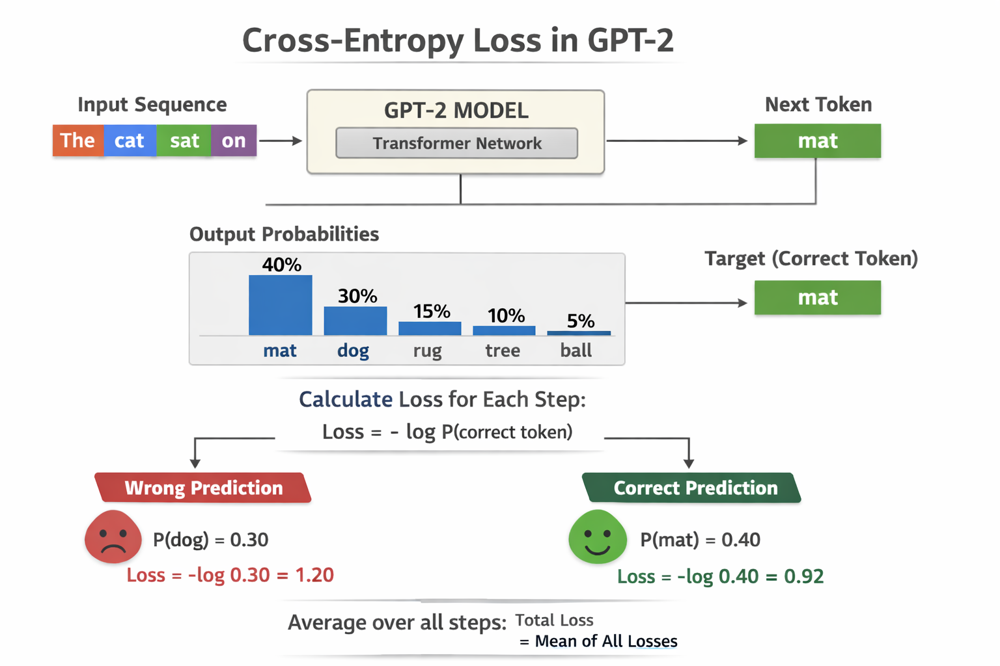

In [11]:
#The token probabilities corresponding to the target indices are as follows:
text_idx = 0
target_probas_1 = probas[text_idx, [0, 1, 2], targets[text_idx]]
print("Text 1:", target_probas_1)

text_idx = 1
target_probas_2 = probas[text_idx, [0, 1, 2], targets[text_idx]]
print("Text 2:", target_probas_2)

Text 1: tensor([7.4541e-05, 2.9624e-05, 1.2002e-05])
Text 2: tensor([1.0337e-05, 5.5172e-05, 5.1407e-06])


In [12]:
# Compute logarithm of all token probabilities
log_probas = torch.log(torch.cat((target_probas_1, target_probas_2)))
print(log_probas)

tensor([ -9.5042, -10.4269, -11.3305, -11.4798,  -9.8050, -12.1783])


In [13]:
# Calculate the average probability for each token
avg_log_probas = torch.mean(log_probas)
print(avg_log_probas)

tensor(-10.7875)


In [14]:
# the cross entropy 
neg_avg_log_probas = avg_log_probas * -1
print(neg_avg_log_probas)

tensor(10.7875)


**PyTorch already implements a cross_entropy function that carries out the previous steps**

- Before we apply the cross_entropy function, let's check the shape of the logits and targets

In [15]:
# Logits have shape (batch_size, num_tokens, vocab_size)
print("Logits shape:", logits.shape)

# Targets have shape (batch_size, num_tokens)
print("Targets shape:", targets.shape)

Logits shape: torch.Size([2, 3, 50257])
Targets shape: torch.Size([2, 3])


**For the cross_entropy function in PyTorch, we want to flatten these tensors by combining them over the batch dimension:**

In [16]:
logits_flat = logits.flatten(0, 1)
targets_flat = targets.flatten()

print("Flattened logits:", logits_flat.shape)
print("Flattened targets:", targets_flat.shape)

Flattened logits: torch.Size([6, 50257])
Flattened targets: torch.Size([6])


**Note that the targets are the token IDs, which also represent the index positions in the logits tensors that we want to maximize.**

- The cross_entropy function in PyTorch will automatically take care of applying the softmax and log-probability computation internally over those token indices in the logits that are to be maximized

In [17]:
loss = torch.nn.functional.cross_entropy(logits_flat, targets_flat)
print(loss)

tensor(10.7875)


## Perplexity (Simple Explanation)

**Perplexity** measures how *confused* a language model is when predicting the next word.

- **Low perplexity** → model predicts well  
- **High perplexity** → model is confused  

### Intuition
Perplexity answers this question:
> “On average, how many choices does the model think it has for the next word?”

### Example
Sentence:
> I drink coffee every ___

Easy to predict → **low perplexity**

Sentence:
> Quantum banana democracy sleeps ___

Hard to predict → **high perplexity**

### In Language Models
Perplexity is calculated from the training loss:

$\[
\text{Perplexity} = e^{\text{loss}}
\$]

Lower loss → lower perplexity → better model.

### Why It Matters
- Evaluates language models  
- Tracks training quality  
- Common metric in LLMs


In [18]:
perplexity = torch.exp(loss)
print(perplexity)

tensor(48409.9336)


## Evaluating LLM performance on real dataset
### Calculating the training and validation set losses

**We use a relatively small dataset for training the LLM (in fact, only one short story)**


In [19]:
#1- load the data set 
file_path ="the-verdict.txt"
with open(file_path, "r", encoding="utf-8") as file:
    text_data = file.read()
# First 100 characters
print(text_data[:99])
# Last 100 characters
print(text_data[-99:])

I HAD always thought Jack Gisburn rather a cheap genius--though a good fellow enough--so it was no 
it for me! The Strouds stand alone, and happen once--but there's no exterminating our kind of art."


In [20]:
total_characters = len(text_data)
total_tokens = len(tokenizer.encode(text_data))

print("Characters:", total_characters)
print("Tokens:", total_tokens)

Characters: 20479
Tokens: 5145


### split the data set into training and validation 
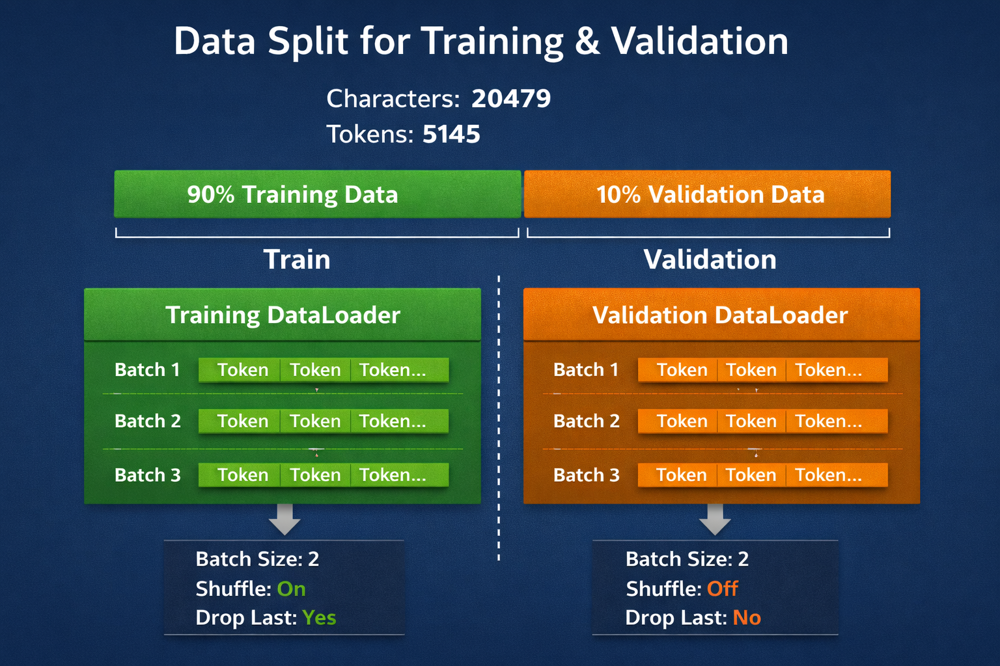

**get the dataset and dataloader which we created in first part**

In [21]:
# Dataset --> is th pythorch class  
class LLMDataset(Dataset):
    # stride --> how much we will shift the data if =1 then each time we will shift input text by 1 and predict next word 
    def __init__(self,txt,toknizer,max_length,stride):
        self.input_ids  = []
        self.target_ids = []

        #toknize the whole data set and add end_of_text
        token_ids = tokenizer.encode(txt, allowed_special={"<|endoftext|>"})

        # then devide the data into input and target chunks but as tensors not list
        for i in range(0,len(token_ids) - max_length,stride ):
            input_chunk = token_ids[i : i + max_length]
            target_chunk= token_ids[i + 1 : i + max_length + 1]
            self.input_ids.append(torch.tensor(input_chunk))
            self.target_ids.append(torch.tensor(target_chunk))

    def  __getitem__(self,index):
        return self.input_ids[index], self.target_ids[index]

    def __len__(self):
        return len(self.input_ids)


## data loader 

def Create_Dataloader(txt, batch_size=4, max_length=256, 
                         stride=128, shuffle=True, drop_last=True,
                         num_workers=0):
    #intializt our tokinizer 
    tokenizer = tiktoken.get_encoding("gpt2")

    dataset = LLMDataset(txt,tokenizer,max_length,stride)

    dataloader = DataLoader(dataset, batch_size=batch_size,
                            shuffle=shuffle, drop_last=drop_last,
                             num_workers=num_workers)
    return dataloader
    

**With 5,145 tokens, the text is very short for training an LLM but its only for iilustration**

In [22]:
# Train/validation ratio
train_ratio = 0.90
split_idx = int(train_ratio * len(text_data))
train_data = text_data[:split_idx]
val_data = text_data[split_idx:]


torch.manual_seed(123)

train_loader = Create_Dataloader(
    train_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M["context_length"], #"context_length": 256, # Shortened context length (orig: 1024)
    stride=GPT_CONFIG_124M["context_length"],
    drop_last=True,
    shuffle=True,
    num_workers=0
)

val_loader = Create_Dataloader(
    val_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M["context_length"],
    stride=GPT_CONFIG_124M["context_length"],
    drop_last=False,
    shuffle=False,
    num_workers=0
)

**We use a relatively small batch size to reduce the computational resource demand, and because the dataset is very small to begin with.**

In [23]:
print("Train loader:")
for x, y in train_loader:
    print(x.shape, y.shape)

print("\nValidation loader:")
for x, y in val_loader:
    print(x.shape, y.shape)

Train loader:
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])

Validation loader:
torch.Size([2, 256]) torch.Size([2, 256])


**Next, we implement a utility function to calculate the cross-entropy loss of a given batch.**

In [24]:
def calc_loss_batch(input_batch, target_batch, model, device):
    input_batch, target_batch = input_batch.to(device), target_batch.to(device)
    logits = model(input_batch)
    loss = torch.nn.functional.cross_entropy(logits.flatten(0, 1), target_batch.flatten())
    return loss

#In addition, we implement a second utility function to compute the loss for a user-specified number of batches in a data loader.
def calc_loss_loader(data_loader, model, device, num_batches=None):
    total_loss = 0.
    if len(data_loader) == 0:
        return float("nan")
    elif num_batches is None:
        num_batches = len(data_loader)
    else:
        # Reduce the number of batches to match the total number of batches in the data loader
        # if num_batches exceeds the number of batches in the data loader
        num_batches = min(num_batches, len(data_loader))
    for i, (input_batch, target_batch) in enumerate(data_loader):
        if i < num_batches:
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            total_loss += loss.item()
        else:
            break
    return total_loss / num_batches

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device) # no assignment model = model.to(device) necessary for nn.Module classes


torch.manual_seed(123) # For reproducibility due to the shuffling in the data loader

with torch.no_grad(): # Disable gradient tracking for efficiency because we are not training, yet
    train_loss = calc_loss_loader(train_loader, model, device)
    val_loss = calc_loss_loader(val_loader, model, device)

print("Training loss:", train_loss)
print("Validation loss:", val_loss)

Training loss: 10.987869580586752
Validation loss: 10.98089599609375


## 2-TRAINING LOOP FOR THE LLM
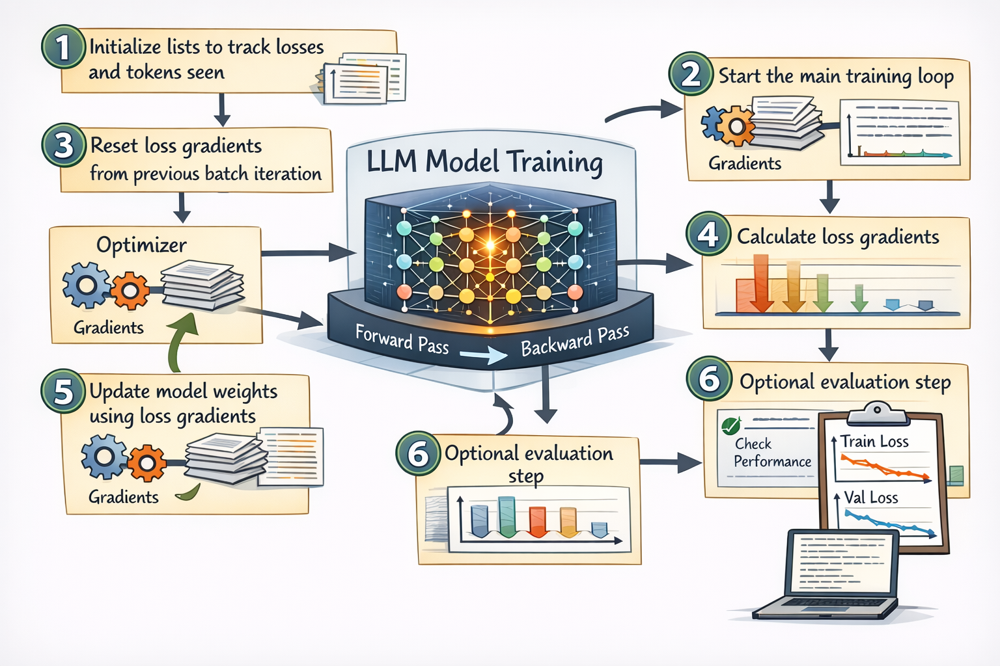

In [26]:
# this function to evaluate the model after each epoch
def evaluate_model(model, train_loader, val_loader, device, eval_iter):
    model.eval()
    with torch.no_grad():
        train_loss = calc_loss_loader(train_loader, model, device, num_batches=eval_iter)
        val_loss = calc_loss_loader(val_loader, model, device, num_batches=eval_iter)
    model.train()
    return train_loss, val_loss
    
# the main trainig function
def train_model_simple(model, train_loader, val_loader, optimizer, device, num_epochs,
                       eval_freq, eval_iter, start_context, tokenizer):
    # Initialize lists to track losses and tokens seen
    train_losses, val_losses, track_tokens_seen = [], [], []
    tokens_seen, global_step = 0, -1

    # Main training loop
    for epoch in range(num_epochs):
        model.train()  # Set model to training mode
        
        for input_batch, target_batch in train_loader:
            optimizer.zero_grad() # Reset loss gradients from previous batch iteration
            loss = calc_loss_batch(input_batch, target_batch, model, device)
            loss.backward() # Calculate loss gradients
            optimizer.step() # Update model weights using loss gradients
            tokens_seen += input_batch.numel() # Returns the total number of elements (or tokens) in the input_batch.
            global_step += 1

            # Optional evaluation step using the function we creeated in the first line 
            if global_step % eval_freq == 0: 
                train_loss, val_loss = evaluate_model(
                    model, train_loader, val_loader, device, eval_iter)
                train_losses.append(train_loss)
                val_losses.append(val_loss)
                track_tokens_seen.append(tokens_seen)
                print(f"Ep {epoch+1} (Step {global_step:06d}): "
                      f"Train loss {train_loss:.3f}, Val loss {val_loss:.3f}")

        # Print a sample text after each epoch
        generate_and_print_sample(
            model, tokenizer, device, start_context
        )

    return train_losses, val_losses, track_tokens_seen

**The generate_and_print_sample function is a convenience function that we use to track whether the model improves during the training.**

- In particular, the generate_and_print_sample function takes a text snippet (start_context) as input, 
- converts it into token IDs, and feeds it to the LLM to generate a text sample using the generate_text_simple function we used earlier

In [27]:
def generate_and_print_sample(model, tokenizer, device, start_context):
    model.eval()
    context_size = model.pos_emb.weight.shape[0]
    encoded = text_to_token_ids(start_context, tokenizer).to(device)
    with torch.no_grad():
        token_ids = generate_text_simple(
            model=model, idx=encoded,
            max_new_tokens=50, context_size=context_size
        )
    decoded_text = token_ids_to_text(token_ids, tokenizer)
    print(decoded_text.replace("\n", " "))  # Compact print format
    model.train()

**Let's see this all in action by training a GPTModel instance for 10 epochs using an `AdamW` optimizer and the train_model_simple function we defined earlier.**

In [28]:
start_time = time.time()

torch.manual_seed(123)
#model 
model = GPTModel(GPT_CONFIG_124M)
#in my case its cude(GPU)
model.to(device)
# use adam optimizer for calc the gradients
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0004, weight_decay=0.1)

num_epochs = 10
train_losses, val_losses, tokens_seen = train_model_simple(
    model, train_loader, val_loader, optimizer, device,
    num_epochs=num_epochs, eval_freq=5,   # this tells us when wen evaluate the model i made it every 5 batches 
     eval_iter=5,start_context="Every effort moves you" , # this sentence which the model will produce the next 50 tokens of it 
     tokenizer=tokenizer
)

#time for training 
end_time = time.time()
execution_time_minutes = (end_time - start_time) / 60
print(f"Training completed in {execution_time_minutes:.2f} minutes.")

Ep 1 (Step 000000): Train loss 9.825, Val loss 9.930
Ep 1 (Step 000005): Train loss 8.065, Val loss 8.332
Every effort moves you,,,,,,,,,,,,.                                     
Ep 2 (Step 000010): Train loss 6.622, Val loss 7.046
Ep 2 (Step 000015): Train loss 6.046, Val loss 6.597
Every effort moves you, and,, and,,,,,,,,,.                                   
Ep 3 (Step 000020): Train loss 5.585, Val loss 6.480
Ep 3 (Step 000025): Train loss 5.537, Val loss 6.416
Every effort moves you, and, and, and, and, and, and, and. G. Gis, and, and, and, and, and, and, and, and, and, and, and, and, and, and, and,
Ep 4 (Step 000030): Train loss 5.179, Val loss 6.358
Ep 4 (Step 000035): Train loss 4.965, Val loss 6.387
Every effort moves you a " a. Gisburn, and a a " a. Gisburn, and I had been the of the of the picture. I had been the of the of the of the a of the of the a. Gisburn,
Ep 5 (Step 000040): Train loss 4.320, Val loss 6.227
Every effort moves you, I had been a little of the picture to 

**As we can see, based on the results printed during the training, the training loss improves drastically, starting with a value of 9.825 and converging to 0.932.**
- **` this model has overfitting because the data is very small compare to the model`**
- The language skills of the model have improved quite a lot. In the beginning, the model is only able to append commas to the start context ("Every effort moves you,,,,,,,,,,,,") or repeat the word "and".

- At the end of the training, it can generate grammatically correct text.
- Similar to the training set loss, we can see that the validation loss starts high (9.856) and decreases during the training.

- However, it never becomes as small as the training set loss and remains at 6.372 after the 10th epoch.(over fitting)

**Let's create a simple plot that shows the training and validation set losses side by side**

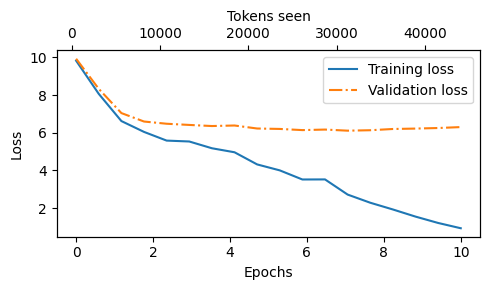

In [29]:
def plot_losses(epochs_seen, tokens_seen, train_losses, val_losses):
    fig, ax1 = plt.subplots(figsize=(5, 3))

    # Plot training and validation loss against epochs
    ax1.plot(epochs_seen, train_losses, label="Training loss")
    ax1.plot(epochs_seen, val_losses, linestyle="-.", label="Validation loss")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Loss")
    ax1.legend(loc="upper right")
    ax1.xaxis.set_major_locator(MaxNLocator(integer=True))  # only show integer labels on x-axis

    # Create a second x-axis for tokens seen
    ax2 = ax1.twiny()  # Create a second x-axis that shares the same y-axis
    ax2.plot(tokens_seen, train_losses, alpha=0)  # Invisible plot for aligning ticks
    ax2.set_xlabel("Tokens seen")

    fig.tight_layout()  # Adjust layout to make room
    plt.savefig("loss-plot.pdf")
    plt.show()

epochs_tensor = torch.linspace(0, num_epochs, len(train_losses))
plot_losses(epochs_tensor, tokens_seen, train_losses, val_losses)

**Both the training and validation losses start to improve for the first epoch. However, the losses start to diverge past the second epoch.**

**This divergence and the fact that the validation loss is much larger than the training loss indicate that the model is overfitting to the training data.**

### **Adding more data to see if the model will be better i downloaded the 7 books of harry potter and i will use them**  

In [30]:
def load_texts_from_folder(folder_path):
    texts = []
    for file_path in glob.glob(f"{folder_path}/*.txt"):
        with open(file_path, "r", encoding="utf-8") as f:
            texts.append(f.read())
    return "\n\n".join(texts)

text_data = load_texts_from_folder("data") 
print(text_data[0:100])
print(len(text_data))

M r. and Mrs. Dursley, of number four, Privet Drive, were proud to say that they were perfectly norm
6285450


In [31]:
# Train/validation ratio
train_ratio = 0.90
split_idx = int(train_ratio * len(text_data))
train_data = text_data[:split_idx]
val_data = text_data[split_idx:]


torch.manual_seed(123)

train_loader = Create_Dataloader(
    train_data,
    batch_size=4,
    max_length=GPT_CONFIG_124M["context_length"], #"context_length": 256, # Shortened context length (orig: 1024)
    stride=GPT_CONFIG_124M["context_length"],
    drop_last=True,
    shuffle=True,
    num_workers=0
)

val_loader = Create_Dataloader(
    val_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M["context_length"],
    stride=GPT_CONFIG_124M["context_length"],
    drop_last=False,
    shuffle=False,
    num_workers=0
)

In [32]:
checkpoint_path = "model_weights.pt"
enhanced_model = GPTModel(GPT_CONFIG_124M)
if os.path.exists(checkpoint_path):
   # load the model to save time because this model took 3 hours to train
    state_dict = torch.load(checkpoint_path, map_location=device)
    enhanced_model.load_state_dict(state_dict)
    enhanced_model.to(device)
    print("Loaded existing weights, skipping training.")

else:
    print("start training...")
    start_time = time.time()

    torch.manual_seed(123)
    #model  will update the previous one 
    model = model
    #in my case its cude(GPU)
    model.to(device)
    # use adam optimizer for calc the gradients
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.1)

    num_epochs = 2
    train_losses, val_losses, tokens_seen = train_model_simple(
        model, train_loader, val_loader, optimizer, device,
        num_epochs=num_epochs, eval_freq=50,   
        eval_iter=10,start_context="hello my name is" , # this sentence which the model will produce the next 50 tokens of it 
        tokenizer=tokenizer
        )

    #time for training 
    end_time = time.time()
    execution_time_minutes = (end_time - start_time) / 60
    print(f"Training completed in {execution_time_minutes:.2f} minutes.")
    checkpoint_path = "model_weights.pt"
    torch.save(model.state_dict(), checkpoint_path)
    print(f"Model weights saved to {checkpoint_path}")

Loaded existing weights, skipping training.


In [33]:
enhanced_model = enhanced_model.to(device)
enhanced_model.eval()
tokenizer = tiktoken.get_encoding("gpt2")

token_ids = generate_text_simple(
    model=enhanced_model,
    idx = text_to_token_ids("every effort moves you to ", tokenizer).to(device),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 every effort moves you to  you,” said Harry.

“I’m not going to tell you,” said Ron


**The generated output confirms that the model has successfully learned basic language structure and coherence.**
- **Despite minor repetition and limited long-term consistency, the results are expected given the model size and training setup.**
-  **Overall, the model demonstrates correct architecture, effective training, and provides a solid foundation for further improvements.**

## 3-DECODING STRATEGIES TO CONTROL RANDOMNESS
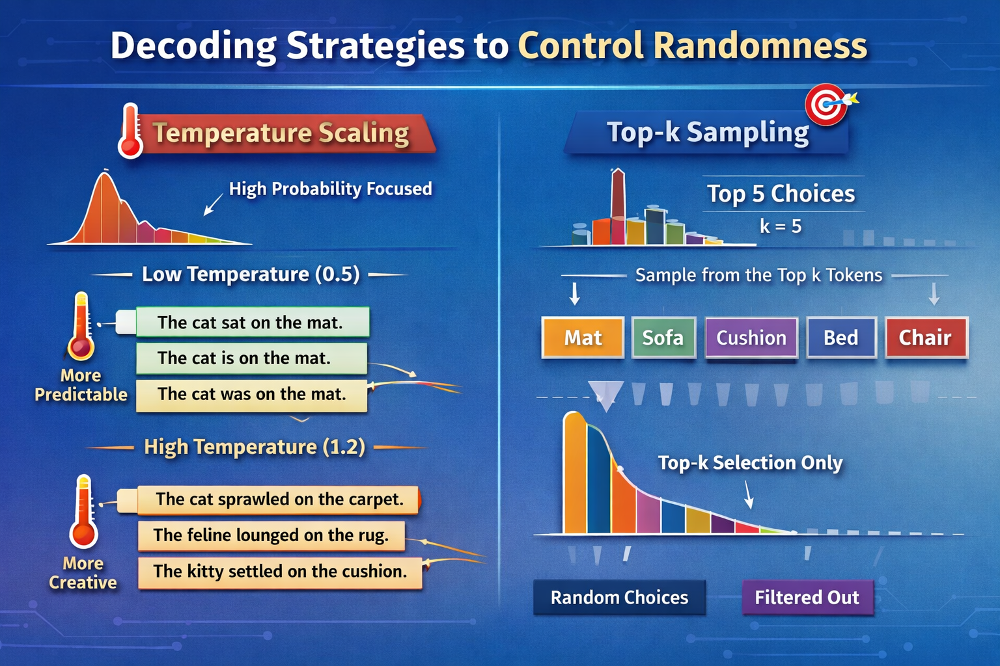

**first lets genrate some text**

In [34]:
#make sure that both model in eval mode to turn off random components such as dropout
model.eval()
enhanced_model.eval()
#toknizer
tokenizer = tiktoken.get_encoding("gpt2")
#the first model 
token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(device),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M["context_length"]
)
#the second model harry potter model
token_ids_2 = generate_text_simple(
    model=enhanced_model,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(device),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output text first model:\n", token_ids_to_text(token_ids, tokenizer))
print("Output text second model:\n", token_ids_to_text(token_ids_2, tokenizer))

Output text first model:
 Every effort moves you?"

"Yes--quite insensible to the irony. She wanted him vindicated--and by me!"


Output text second model:
 Every effort moves you,” said Harry.

“I’m sorry,” said Ron.

“


### DECODING STRATEGY 1: TEMPERATURE SCALING

**Previously, inside the generate_text_simple function, we always sampled the token with the highest probability as the next token using torch.argmax, also known as greedy decoding.**

- To generate text with more variety, we can replace the argmax with a function that samples from a probability distribution (here, the probability scores the LLM generates for each vocabulary entry at each token generation step).
- To illustrate the probabilistic sampling with a concrete example, let's briefly discuss the next-token generation process using a very small vocabulary for illustration purposes:

In [35]:
##asume we have this vocab
vocab = { 
    "closer": 0,
    "every": 1, 
    "effort": 2, 
    "forward": 3,
    "inches": 4,
    "moves": 5, 
    "pizza": 6,
    "toward": 7,
    "you": 8,
} 
inverse_vocab = {v: k for k, v in vocab.items()}

# Next, assume the LLM is given the start context "every effort moves you" and generates the following next-token logits:
next_token_logits = torch.tensor(
[4.51, 0.89, -1.90, 6.75, 1.63, -1.62, -1.89, 6.28, 1.79])

# the softmax function and obtain the token ID corresponding the generated token via the argmax function, which we can then map back into text via the inverse vocabulary:
probas = torch.softmax(next_token_logits, dim=0)
next_token_id = torch.argmax(probas).item()
print(inverse_vocab[next_token_id])

forward


**To implement a probabilistic sampling process, we can now replace the argmax with the multinomial function in PyTorch**

In [36]:
torch.manual_seed(123)
next_token_id = torch.multinomial(probas, num_samples=1).item()
print(inverse_vocab[next_token_id])

forward


**The printed output is "forward" just like before. What happened? The multinomial function samples the next token proportional to its probability score.**

- In other words, "forward" is still the most likely token and will be selected by multinomial most of the time but not all the time.

- To illustrate this, let's implement a function that repeats this sampling 1000 times:

In [37]:
def print_sampled_tokens(probas):
    torch.manual_seed(123) # Manual seed for reproducibility
    sample = [torch.multinomial(probas, num_samples=1).item() for i in range(1_000)]
    sampled_ids = torch.bincount(torch.tensor(sample))
    for i, freq in enumerate(sampled_ids):
        print(f"{freq} x {inverse_vocab[i]}")

print_sampled_tokens(probas)

73 x closer
0 x every
0 x effort
582 x forward
2 x inches
0 x moves
0 x pizza
343 x toward


**As we can see based on the output, the word "forward" is sampled most of the time (582 out of 1000 times), but other tokens such as "closer", "inches", and "toward" will also be sampled some of the time.**

- This means that if we replaced the argmax function with the multinomial function inside the generate_and_print_sample function, the LLM would sometimes generate texts such as `"every effort moves you toward"`, `"every effort moves you inches"`, and `"every effort moves you closer"` instead of `"every effort moves you forward"`.

**temperature scaling, where temperature scaling is just a fancy description for dividing the logits by a number greater than 0:**
- Temperatures greater than 1 result in more uniformly distributed token probabilities,
- Temperatures smaller than 1 will result in more confident (sharper or more peaky) distributions.



In [38]:
def softmax_with_temperature(logits, temperature):
    scaled_logits = logits / temperature
    return torch.softmax(scaled_logits, dim=0)

# Temperature values
temperatures = [1, 0.1, 5]  # Original, higher confidence, and lower confidence

# Calculate scaled probabilities
scaled_probas = [softmax_with_temperature(next_token_logits, T) for T in temperatures]

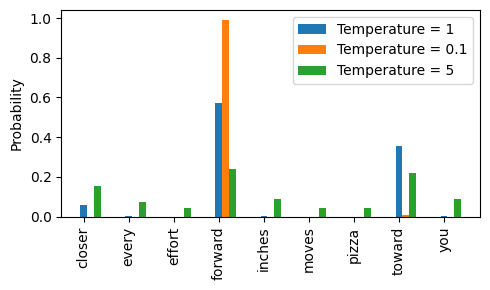

In [39]:
# Plotting
x = torch.arange(len(vocab))
bar_width = 0.15

fig, ax = plt.subplots(figsize=(5, 3))
for i, T in enumerate(temperatures):
    rects = ax.bar(x + i * bar_width, scaled_probas[i], bar_width, label=f'Temperature = {T}')

ax.set_ylabel('Probability')
ax.set_xticks(x)
ax.set_xticklabels(vocab.keys(), rotation=90)
ax.legend()

plt.tight_layout()
plt.savefig("temperature-plot.pdf")
plt.show()

**Applying very small temperatures, such as 0.1, will result in sharper distributions such that the behavior of the multinomial function selects the most likely token (here: "forward") almost 100% of the time, approaching the behavior of the argmax function.**

- Vice versa, a temperature of 5 results in a more uniform distribution where other tokens are selected more often.

In [40]:
def generate_text_simple_with_temp_scaling(model, idx, max_new_tokens, context_size, temperature=1.0):
    for _ in range(max_new_tokens):

        # Crop context
        idx_cond = idx[:, -context_size:]

        # Forward pass
        with torch.no_grad():
            logits = model(idx_cond)

        # Take logits of last token
        logits = logits[:, -1, :]  # (batch, vocab_size)

        # first change Temperature scaling (IMPORTANT)
        if temperature != 1.0:
            logits = logits / temperature

        # Convert to probabilities
        probas = torch.softmax(logits, dim=-1)

        # Sample next token (instead of argmax) second change 
        idx_next = torch.multinomial(probas, num_samples=1)

        # Append token
        idx = torch.cat((idx, idx_next), dim=1)

    return idx

#create or genrate new tokens 
token_ids = generate_text_simple_with_temp_scaling(
    model=model,
    idx=text_to_token_ids(start_context, tokenizer).to(device),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M["context_length"],
    temperature=1.2
)
##create or genrate new tokens 
token_ids_2 = generate_text_simple_with_temp_scaling(
    model=enhanced_model,
    idx=text_to_token_ids(start_context, tokenizer).to(device),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M["context_length"],
    temperature=1.2
)
# get the tokens from token ids 
print("Output text model 1:\n", token_ids_to_text(token_ids, tokenizer))

# get the tokens from token ids 
print("Output text enhanced model :\n", token_ids_to_text(token_ids_2, tokenizer))

Output text model 1:
 Every effort moves you asrow detecting Neg2015edcommunication analysts hadn where visions": Teachinginteresting things I touchedJoe jump work, with hard rightly implicitly
Output text enhanced model :
 Every effort moves you won’t watching cheer you therefore old followers them at yourastingly. Any attempt in a beans rules trust towards S


- **as we can see model one became very very bad because it trained with very very small data set and has high over fitting**

- **but the enhaced model which has mor training which also has over fitting became a little better and give acepted words**

### DECODING STRATEGY 2: Top-k sampling

**top-k sampling, which, when combined with probabilistic sampling and temperature scaling, can improve the text generation results.**

- In top-k sampling, we can restrict the sampled tokens to the top-k most likely tokens and exclude all other tokens from the selection process by masking their probability scores.



In [41]:
# Next, assume the LLM is given the start context "every effort moves you" and generates the following next-token logits:
next_token_logits = torch.tensor(
[4.51, 0.89, -1.90, 6.75, 1.63, -1.62, -1.89, 6.28, 1.79])
# top 3 values
top_k = 3
top_logits, top_pos = torch.topk(next_token_logits, top_k)
print("Top logits:", top_logits)
print("Top positions:", top_pos)

Top logits: tensor([6.7500, 6.2800, 4.5100])
Top positions: tensor([3, 7, 0])


**we apply PyTorch's where function to set the logit values of tokens that are below the lowest logit value within our top-3 selection to negative infinity (-inf).**

In [42]:
new_logits = torch.where(
    condition=next_token_logits < min(top_logits),
    input=torch.tensor(float("-inf")), 
    other=next_token_logits
)

print(new_logits)

tensor([4.5100,   -inf,   -inf, 6.7500,   -inf,   -inf,   -inf, 6.2800,   -inf])


**Lastly, let's apply the softmax function to turn these into next-token probabilities:**

In [43]:
topk_probas = torch.softmax(new_logits, dim=0)
print(topk_probas)

tensor([0.0615, 0.0000, 0.0000, 0.5775, 0.0000, 0.0000, 0.0000, 0.3610, 0.0000])


### Merge Temperature Scaling and Top-k sampling

In [44]:
def generate(model, idx, max_new_tokens, context_size, temperature=0.0, top_k=None, eos_id=None):

    # For-loop is the same as before: Get logits, and only focus on last time step
    for _ in range(max_new_tokens):
        idx_cond = idx[:, -context_size:]
        with torch.no_grad():
            logits = model(idx_cond)
        logits = logits[:, -1, :]

        # New: Filter logits with top_k sampling
        if top_k is not None:
            # Keep only top_k values
            top_logits, _ = torch.topk(logits, top_k)
            min_val = top_logits[:, -1]
            logits = torch.where(logits < min_val, torch.tensor(float("-inf")).to(logits.device), logits)

        # New: Apply temperature scaling
        if temperature > 0.0:
            logits = logits / temperature

            # Apply softmax to get probabilities
            probs = torch.softmax(logits, dim=-1)  # (batch_size, context_len)

            # Sample from the distribution
            idx_next = torch.multinomial(probs, num_samples=1)  # (batch_size, 1)

        # Otherwise same as before: get idx of the vocab entry with the highest logits value
        else:
            idx_next = torch.argmax(logits, dim=-1, keepdim=True)  # (batch_size, 1)

        if idx_next == eos_id:  # Stop generating early if end-of-sequence token is encountered and eos_id is specified
            break

        # Same as before: append sampled index to the running sequence
        idx = torch.cat((idx, idx_next), dim=1)  # (batch_size, num_tokens+1)

    return idx

**Let's now see this new generate function in action:**

In [45]:
#create or genrate new tokens 
token_ids = generate(
    model=model,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(device),
    max_new_tokens=15,
    context_size=GPT_CONFIG_124M["context_length"],
    top_k=15,
    temperature=1.2
)
##create or genrate new tokens 
token_ids_2 =  generate(
    model=enhanced_model,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(device),
    max_new_tokens=15,
    context_size=GPT_CONFIG_124M["context_length"],
    top_k=30,
    temperature=1.4
)
# get the tokens from token ids 
print("Output text model 1:\n", token_ids_to_text(token_ids, tokenizer))

# get the tokens from token ids 
print("Output text enhanced model :\n", token_ids_to_text(token_ids_2, tokenizer))

Output text model 1:
 Every effort moves you know; then cheeks furrowed by a smile that lifted the Riviera
Output text enhanced model :
 Every effort moves you get out to use a second and we never wanted you to try a house


- **note : this gives us a littel better sentences**
- **but we can say that now the model not just memorizing it now can genrate**

## THE LAST PART LOADING PRETRAINED WEIGHTS FROM OPENAI


**Previously, for educational purposes, we trained a small GPT-2 model using a limited dataset**

- This approach allowed us to focus on the fundamentals without the need for extensive time and computational resources.

- Fortunately, OpenAI openly shared the weights of their GPT-2 models.

- Note that OpenAI originally saved the GPT-2 weights via TensorFlow, which we have to install to load the weights in Python. 

In [46]:
print("TensorFlow version:", tf.__version__)
print("tqdm version:", tqdm.__version__)

TensorFlow version: 2.20.0
tqdm version: 4.67.1


In [47]:
#from the file that have the functions that will download the parameters to our model 
from GPT_downloader import download_and_load_gpt2

In [48]:
settings, params = download_and_load_gpt2(model_size="124M", models_dir="gpt2")

C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\checkpoint


C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\encoder.json


C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\hparams.json


C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\model.ckpt.data-00000-of-00001


C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\model.ckpt.index


C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\model.ckpt.meta


C:\Users\BS\anaconda3\envs\py_12\Lib\site-packages\urllib3\connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'openaipublic.blob.core.windows.net'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


File already exists and is up-to-date: gpt2\124M\vocab.bpe


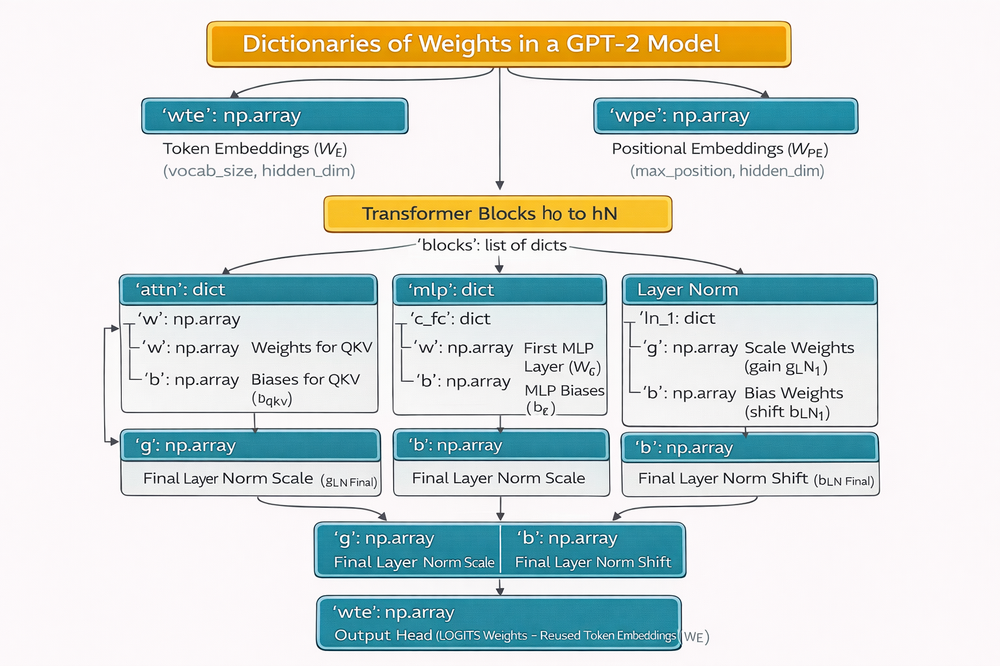

**After the execution of the previous code has been completed, let's inspect the contents of settings and params:**

In [49]:
print("Settings:", settings)
print("Parameter dictionary keys:", params.keys())

Settings: {'n_vocab': 50257, 'n_ctx': 1024, 'n_embd': 768, 'n_head': 12, 'n_layer': 12}
Parameter dictionary keys: dict_keys(['blocks', 'b', 'g', 'wpe', 'wte'])


In [50]:
print(params["wte"])
print("Token embedding weight tensor dimensions:", params["wte"].shape)

[[-0.11010301 -0.03926672  0.03310751 ... -0.1363697   0.01506208
   0.04531523]
 [ 0.04034033 -0.04861503  0.04624869 ...  0.08605453  0.00253983
   0.04318958]
 [-0.12746179  0.04793796  0.18410145 ...  0.08991534 -0.12972379
  -0.08785918]
 ...
 [-0.04453601 -0.05483596  0.01225674 ...  0.10435229  0.09783269
  -0.06952604]
 [ 0.1860082   0.01665728  0.04611587 ... -0.09625227  0.07847701
  -0.02245961]
 [ 0.05135201 -0.02768905  0.0499369  ...  0.00704835  0.15519823
   0.12067825]]
Token embedding weight tensor dimensions: (50257, 768)


**Above, we loaded the 124M GPT-2 model weights into Python, however we still need to transfer them into our GPTModel instance.**

- First, we initialize a new GPTModel instance.

In [51]:
# Define model configurations in a dictionary for compactness
model_configs = {
    "gpt2-small (124M)": {"emb_dim": 768, "n_layers": 12, "n_heads": 12},
    "gpt2-medium (355M)": {"emb_dim": 1024, "n_layers": 24, "n_heads": 16},
    "gpt2-large (774M)": {"emb_dim": 1280, "n_layers": 36, "n_heads": 20},
    "gpt2-xl (1558M)": {"emb_dim": 1600, "n_layers": 48, "n_heads": 25},
}

# Copy the base configuration and update with specific model settings
model_name = "gpt2-small (124M)"  # Example model name
NEW_CONFIG = GPT_CONFIG_124M.copy()
NEW_CONFIG.update(model_configs[model_name])

**we used a 256-token length earlier, but the original GPT-2 models from OpenAI were trained with a 1,024-token length, so we have to update the NEW_CONFIG accordingly:**

- Bias vectors are not commonly used in LLMs anymore as they don't improve the modeling performance and are thus unnecessary.
- However, since we are working with pretrained weights, we need to match the settings for consistency and enable these bias vectors:

In [52]:
NEW_CONFIG.update({"context_length": 1024, "qkv_bias": True})
GPT = GPTModel(NEW_CONFIG)
GPT.eval();

**By default, the GPTModel instance is initialized with random weights for pretraining.**
- The last step to using OpenAI's model weights is to override these random weights with the weights we loaded into the params dictionary.

**For this, we will first define a small assign utility function that checks whether two tensors or arrays (left and right) have the same dimensions or shape and returns the right tensor as trainable PyTorch parameters:**

In [53]:
def assign(left, right):
    if left.shape != right.shape:
        raise ValueError(f"Shape mismatch. Left: {left.shape}, Right: {right.shape}")
    return torch.nn.Parameter(torch.tensor(right, dtype=left.dtype, device=left.device))

**THE FUNCTION WHICH WILL ASSIGN THE trained weights of gpt_2 from OPENAI TO OUR MODEL INTIAL RANDOM WEIGHTS**

In [54]:
def load_weights_into_gpt(gpt, params):
    # assign the weights of the postional emmbedings 
    gpt.pos_emb.weight = assign(gpt.pos_emb.weight, params['wpe'])
    # assign the weights of the token emmbedings 
    gpt.tok_emb.weight = assign(gpt.tok_emb.weight, params['wte'])

    ## assign the weights of the transformer block  
    for b in range(len(params["blocks"])):
        # assing the weights of Q,K,V OF THE ATTENTION  
        q_w, k_w, v_w = np.split(
            (params["blocks"][b]["attn"]["c_attn"])["w"], 3, axis=-1)
        gpt.trf_blocks[b].att.W_Q.weight = assign(
            gpt.trf_blocks[b].att.W_Q.weight, q_w.T)
        gpt.trf_blocks[b].att.W_K.weight = assign(
            gpt.trf_blocks[b].att.W_K.weight, k_w.T)
        gpt.trf_blocks[b].att.W_V.weight = assign(
            gpt.trf_blocks[b].att.W_V.weight, v_w.T)
        
         # assing the biases of Q,K,V OF THE ATTENTION 
        q_b, k_b, v_b = np.split(
            (params["blocks"][b]["attn"]["c_attn"])["b"], 3, axis=-1)
        gpt.trf_blocks[b].att.W_Q.bias = assign(
            gpt.trf_blocks[b].att.W_Q.bias, q_b)
        gpt.trf_blocks[b].att.W_K.bias = assign(
            gpt.trf_blocks[b].att.W_K.bias, k_b)
        gpt.trf_blocks[b].att.W_V.bias = assign(
            gpt.trf_blocks[b].att.W_V.bias, v_b)

        # assing the weights and the biases of Output Projection (Attention Output)
        gpt.trf_blocks[b].att.out_proj.weight = assign(
            gpt.trf_blocks[b].att.out_proj.weight, 
            params["blocks"][b]["attn"]["c_proj"]["w"].T)
        gpt.trf_blocks[b].att.out_proj.bias = assign(
            gpt.trf_blocks[b].att.out_proj.bias, 
            params["blocks"][b]["attn"]["c_proj"]["b"])

          # assing the weights and the biases of FFD NN OF THE ATTENTION 
        gpt.trf_blocks[b].ff.layers[0].weight = assign(
            gpt.trf_blocks[b].ff.layers[0].weight, 
            params["blocks"][b]["mlp"]["c_fc"]["w"].T)
        gpt.trf_blocks[b].ff.layers[0].bias = assign(
            gpt.trf_blocks[b].ff.layers[0].bias, 
            params["blocks"][b]["mlp"]["c_fc"]["b"])
        gpt.trf_blocks[b].ff.layers[2].weight = assign(
            gpt.trf_blocks[b].ff.layers[2].weight, 
            params["blocks"][b]["mlp"]["c_proj"]["w"].T)
        gpt.trf_blocks[b].ff.layers[2].bias = assign(
            gpt.trf_blocks[b].ff.layers[2].bias, 
            params["blocks"][b]["mlp"]["c_proj"]["b"])

          # assing the weights and the biases LAYER NORM1 OF THE ATTENTION 
        gpt.trf_blocks[b].norm1.scale = assign(
            gpt.trf_blocks[b].norm1.scale, 
            params["blocks"][b]["ln_1"]["g"])
        gpt.trf_blocks[b].norm1.shift = assign(
            gpt.trf_blocks[b].norm1.shift, 
            params["blocks"][b]["ln_1"]["b"])
        # assing the weights and the biases LAYER NORM2 OF THE ATTENTION 
        gpt.trf_blocks[b].norm2.scale = assign(
            gpt.trf_blocks[b].norm2.scale, 
            params["blocks"][b]["ln_2"]["g"])
        gpt.trf_blocks[b].norm2.shift = assign(
            gpt.trf_blocks[b].norm2.shift, 
            params["blocks"][b]["ln_2"]["b"])
              # assing the weights and the biases FINAL LAYER  
        gpt.out_head.weight = gpt.tok_emb.weight
  # assing the weights and the biases FINAL LAYER NORM 
    gpt.final_norm.scale = assign(gpt.final_norm.scale, params["g"])
  # assing the weights and the biases FINAL  NORM SHIFT 
    gpt.final_norm.shift = assign(gpt.final_norm.shift, params["b"])




**In the load_weights_into_gpt function, we carefully match the weights from OpenAI's implementation with our GPTModel implementation.**

- To pick a specific example, OpenAI stored the weight tensor for the output projection layer for the first transformer block as params["blocks"][0]["attn"]["c_proj"]["w"].
- In our implementation, this weight tensor corresponds to gpt.trf_blocks[b].att.out_proj.weight, where gpt is a GPTModel instance.

**Let's now try the load_weights_into_gpt out in practice and load the OpenAI model weights into our GPTModel instance gpt:**

In [55]:
load_weights_into_gpt(GPT, params)
GPT.to(device);

**If the model is loaded correctly, we can now use it to generate new text using our previous generate function:**

In [56]:
torch.manual_seed(123)

token_ids = generate(
    model=GPT,
    idx=text_to_token_ids("The president said that", tokenizer).to(device),
    max_new_tokens=30,
    context_size=NEW_CONFIG["context_length"],
    top_k=25,
    temperature=1
)

print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 The president said that as the administration considers what steps it should take to improve relations with Cuba, it should make clear that the United States will not seek a negotiated settlement with


**We can be confident that we loaded the model weights correctly because the model can produce coherent text.**

In [57]:
print(type(GPT.tok_emb.weight))
print(isinstance(GPT.tok_emb.weight, torch.nn.Parameter))

<class 'torch.nn.parameter.Parameter'>
True


In [58]:
print(GPT.tok_emb.weight.data_ptr() == GPT.out_head.weight.data_ptr())

True


**THE WEIGHTS UPLOADED CORRECTLY**